In [1]:
import pandas as pd
import numpy as np
import torch

# Step 1: Load the datasets
hc_df = pd.read_csv(r"H_C.txt", sep="\t", header=None, names=["Herb", "Component","Target-disease"])
cp_df = pd.read_csv(r"C_P.txt", sep="\t", header=None, names=["Component", "TargetProtein"])
pd_df = pd.read_csv(r"P_D.txt", sep="\t", header=None, names=["Protein", "Disease","Association"])

In [2]:
print("hi")

hi


# Step 2: Construct Ach (Component × Herb)

In [3]:
components = sorted(hc_df["Component"].unique())
herbs = sorted(hc_df["Herb"].unique())


In [4]:
component_idx = {comp: i for i, comp in enumerate(components)}
herb_idx = {herb: i for i, herb in enumerate(herbs)}

In [5]:
A_ch = np.zeros((len(components), len(herbs)), dtype=int)
A_ch.shape

(1193, 1009)

In [6]:
for _, row in hc_df.iterrows():
    i = component_idx[row["Component"]]
    j = herb_idx[row["Herb"]]
    A_ch[i, j] = 1

In [7]:
# Print the shape of A_ch
print(A_ch.shape)


(1193, 1009)


In [8]:
import pandas as pd

# View as a DataFrame for easier visualization
A_ch_df = pd.DataFrame(A_ch)

# Show the first 10 rows
print(A_ch_df.iloc[:10,:25])


   0   1   2   3   4   5   6   7   8   9   ...  15  16  17  18  19  20  21  \
0   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
1   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
2   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
3   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
4   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
5   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
6   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
7   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
8   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
9   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   

   22  23  24  
0   0   0   1  
1   0   0   0  
2   0   0   0  
3   0   0   0  
4   0   0   0  
5   0   0   0  
6   0   0   0  
7   0   0   0

In [9]:
import pandas as pd

# Assuming you already have A_ch as a numpy array and you have component names and herb names

# Convert A_ch to a DataFrame for easier visualization
A_ch_df = pd.DataFrame(A_ch)

# Get the first row using .iloc
first_row = A_ch_df.iloc[0]

# Find columns where the value is 1
associated_herbs = first_row[first_row == 1].index.tolist()

# Print the result: which herbs (columns) are associated with the first component (row)
print("Herbs associated with the first component:", associated_herbs)


Herbs associated with the first component: [12, 24, 34, 55, 57, 83, 88, 96, 148, 153, 162, 166, 192, 198, 199, 208, 225, 227, 238, 252, 267, 285, 293, 294, 301, 342, 343, 344, 350, 375, 382, 390, 410, 416, 421, 422, 424, 425, 465, 496, 513, 532, 533, 541, 544, 563, 589, 614, 640, 650, 656, 659, 663, 673, 680, 694, 717, 730, 752, 753, 848, 865, 933, 934, 935, 940, 949, 973, 974]


# Step 3: Construct Atd (Protein × Disease)

In [10]:
disease = sorted(pd_df["Disease"].unique())
proteins = sorted(cp_df["TargetProtein"].unique())

In [11]:
disease_idx = {dis: i for i, dis in enumerate(disease)}
protein_idx = {prot: i for i, prot in enumerate(proteins)}


In [12]:
A_td = np.zeros((len(proteins), len(disease)), dtype=int)
A_td.shape

(7258, 11071)

In [13]:
print(pd_df.columns)


Index(['Protein', 'Disease', 'Association'], dtype='object')


In [14]:
for _, row in pd_df.iterrows():
    protein_idx_ = protein_idx[row["Protein"]]
    disease_idx_ = disease_idx[row["Disease"]]
    A_td[protein_idx_, disease_idx_] = 1


In [15]:
import pandas as pd

# View as a DataFrame for easier visualization
A_td_df = pd.DataFrame(A_td)

# Show the first 10 rows
print(A_td_df.iloc[:10,:25])


   0   1   2   3   4   5   6   7   8   9   ...  15  16  17  18  19  20  21  \
0   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
1   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
2   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
3   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
4   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   1   0   0   0   
5   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
6   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
7   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
8   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
9   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   

   22  23  24  
0   0   0   0  
1   0   0   0  
2   0   0   0  
3   0   0   0  
4   1   0   0  
5   0   0   0  
6   0   0   0  
7   0   0   0

In [16]:
import pandas as pd

# Assuming you already have A_ch as a numpy array and you have component names and herb names

# Convert A_ch to a DataFrame for easier visualization
A_td_df = pd.DataFrame(A_td)

# Get the first row using .iloc
first_row = A_td_df.iloc[4]

# Find columns where the value is 1
associated_protein = first_row[first_row == 1].index.tolist()

# Print the result: which herbs (columns) are associated with the first component (row)
print("Protein associated with the first component:", associated_protein)


Protein associated with the first component: [18, 22, 64, 65, 66]


In [17]:
np.save("A_ch.npy", A_ch)
np.save("A_td.npy", A_td)

In [18]:
import json

# Convert all keys to string for JSON serialization
component_idx_clean = {str(k): int(v) for k, v in component_idx.items()}
herb_idx_clean = {str(k): int(v) for k, v in herb_idx.items()}
protein_idx_clean = {str(k): int(v) for k, v in protein_idx.items()}
disease_idx_clean = {str(k): int(v) for k, v in disease_idx.items()}

# Save to JSON
with open("component_idx.json", "w") as f:
    json.dump(component_idx_clean, f)
with open("herb_idx.json", "w") as f:
    json.dump(herb_idx_clean, f)
with open("protein_idx.json", "w") as f:
    json.dump(protein_idx_clean, f)
with open("disease_idx.json", "w") as f:
    json.dump(disease_idx_clean, f)


In [19]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

In [20]:
# Component and Target Protein embeddings
W_C = np.loadtxt(r"compound_embedding-64.txt")  # shape: (1193, 64)
W_T = np.loadtxt(r"protein_low.txt")            # shape: (7258, 64)

In [21]:
W_C = torch.tensor(W_C, dtype=torch.float32)
W_T = torch.tensor(W_T, dtype=torch.float32)
A_ch = torch.tensor(A_ch, dtype=torch.float32)
A_td = torch.tensor(A_td, dtype=torch.float32)

In [22]:
class SelfGating(nn.Module):
    def __init__(self, dim):
        super(SelfGating, self).__init__()
        self.gate = nn.Linear(dim, dim)

    def forward(self, E):
        gated = torch.sigmoid(self.gate(E))
        return gated * E

In [23]:
class HypergraphConv(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(HypergraphConv, self).__init__()
        self.linear = nn.Linear(in_dim, out_dim)

    def forward(self, A, E):
        H = A
        H_T = H.t()

        Dv = torch.sum(H, dim=1)  # (N,)
        De = torch.sum(H, dim=0)  # (M,)

        # Safe inverse: 1 / x where x > 0, else 0
        Dv_inv = torch.diag(torch.where(Dv > 0, 1.0 / Dv, torch.zeros_like(Dv)))
        De_inv = torch.diag(torch.where(De > 0, 1.0 / De, torch.zeros_like(De)))

        # Eq(6) Hyperedge aggregation: M = De^{-1} * H^T * E
        M = De_inv @ H_T @ E

        # Eq(7) Node aggregation: N = Dv^{-1} * H * M
        N = Dv_inv @ H @ M

        out = self.linear(N)

        return F.relu(out + E)


In [24]:
class HGHDA(nn.Module):
    def __init__(self, in_dim=64, hidden_dim=64):
        super(HGHDA, self).__init__()
        self.gate_c = SelfGating(in_dim)
        self.gate_t = SelfGating(in_dim)
        self.conv_c = HypergraphConv(in_dim, hidden_dim)
        self.conv_t = HypergraphConv(in_dim, hidden_dim)

    def forward(self, A_ch, A_td, W_C, W_T):
        W_C = self.gate_c(W_C)
        W_T = self.gate_t(W_T)

        E_H = self.conv_c(A_ch, W_C)  # Herb Embedding from compound graph
        E_P = self.conv_t(A_td, W_T)  # Protein Embedding from protein graph
        # ✅ New: Aggregate proteins to get disease-level embeddings
        E_D = torch.matmul(A_td.T, E_P)  # (11071, 64)
        E_D = E_D / (A_td.T.sum(dim=1, keepdim=True) + 1e-8)  # Normalize by number of proteins per disease
        return E_H, E_D  # Herbs and Diseases


In [25]:
class DualChannelHGNN(nn.Module):
    def __init__(self, in_dim, hidden_dim, out_dim, self_gating=True):
        super(DualChannelHGNN, self).__init__()
        self.self_gating = self_gating
        self.hgcn_herb = HypergraphConv(in_dim, hidden_dim)
        self.hgcn_disease = HypergraphConv(in_dim, hidden_dim)

        if self_gating:
            self.self_gating_layer_h = SelfGating(hidden_dim)
            self.self_gating_layer_d = SelfGating(hidden_dim)

        self.fc_h = nn.Linear(hidden_dim, out_dim)
        self.fc_d = nn.Linear(hidden_dim, out_dim)

        # New interaction layer
        self.interaction_layer = nn.Sequential(
            nn.Linear(4 * out_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 1)
        )

    def forward(self, X_herb, G_herb, X_disease, G_disease):
        H = F.relu(self.hgcn_herb(X_herb, G_herb))
        D = F.relu(self.hgcn_disease(X_disease, G_disease))

        if self.self_gating:
            H = self.self_gating_layer_h(H)
            D = self.self_gating_layer_d(D)

        E_H = self.fc_h(H)
        E_D = self.fc_d(D)
        return E_H, E_D


In [26]:
def score_function(E_H, E_D, herb_idx, disease_idx, model):
    h_vec = F.normalize(E_H[herb_idx], p=2, dim=1)
    d_vec = F.normalize(E_D[disease_idx], p=2, dim=1)

    interaction = torch.cat([h_vec, d_vec, h_vec * d_vec, torch.abs(h_vec - d_vec)], dim=1)
    score = torch.sigmoid(model.interaction_layer(interaction)).squeeze()
    return score


In [51]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, roc_curve, precision_recall_curve
import matplotlib.pyplot as plt
import numpy as np

# ==== Define Model ====
class HypergraphConv(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(HypergraphConv, self).__init__()
        self.linear = nn.Linear(in_dim, out_dim)

    def forward(self, X, G):
        return self.linear(torch.matmul(G.T, X))

class SelfGating(nn.Module):
    def __init__(self, dim):
        super(SelfGating, self).__init__()
        self.gate = nn.Linear(dim, dim)

    def forward(self, X):
        return X * torch.sigmoid(self.gate(X))

class DualHypergraphModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(DualHypergraphModel, self).__init__()
        self.gcn_herb = HypergraphConv(in_features, out_features)
        self.gcn_disease = HypergraphConv(in_features, out_features)

    def forward(self, X_herb, G_herb, X_disease, G_disease):
        E_H = self.gcn_herb(X_herb, G_herb)         # (num_herbs x out_features)
        E_D = self.gcn_disease(X_disease, G_disease) # (num_diseases x out_features)
        return E_H, E_D

def score_function(E_H, E_D, herb_idx, disease_idx, model):
    h_vec = F.normalize(E_H[herb_idx], p=2, dim=1)
    d_vec = F.normalize(E_D[disease_idx], p=2, dim=1)
    interaction = torch.cat([h_vec, d_vec, h_vec * d_vec, torch.abs(h_vec - d_vec)], dim=1)
    score = torch.sigmoid(model.interaction_layer(interaction)).squeeze()
    return score

# ==== Training and Evaluation ====
def train_and_evaluate_kfold(X_herb, G_herb, X_disease, G_disease, herb_indices, disease_indices, labels,
                              in_dim=64, hidden_dim=128, out_dim=64, k=5, epochs=5, batch_size=128):

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(device)
    herb_indices = torch.tensor(herb_indices, dtype=torch.long)
    disease_indices = torch.tensor(disease_indices, dtype=torch.long)
    labels = torch.tensor(labels, dtype=torch.float32)

    dataset = TensorDataset(herb_indices, disease_indices, labels)
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    all_auroc, all_auprc, all_f1, all_accuracy, all_precision, all_recall, all_conf= [], [], [], [], [], [], []

    for fold, (train_idx, test_idx) in enumerate(kf.split(dataset)):
        print(f"\n----- Fold {fold + 1}/{k} -----")
        train_loader = DataLoader(torch.utils.data.Subset(dataset, train_idx), batch_size=batch_size, shuffle=True)
        test_set = torch.utils.data.Subset(dataset, test_idx)
        test_loader = DataLoader(test_set, batch_size=batch_size)

        model = DualChannelHGNN(in_dim, hidden_dim, out_dim).to(device)
        E_H, E_D = model(X_herb.to(device), G_herb.to(device), X_disease.to(device), G_disease.to(device))

        optimizer = optim.Adam(model.parameters(), lr=1e-3)
        loss_fn = nn.BCELoss()
        print("Training")
        for epoch in range(epochs):
            model.train()
            total_loss = 0
            count=0
            for h_idx, d_idx, lbl in train_loader:
                print(count,"/",len(train_loader));count+=1
                h_idx, d_idx, lbl = h_idx.to(device), d_idx.to(device), lbl.to(device)
                optimizer.zero_grad()
                E_H, E_D = model(X_herb.to(device), G_herb.to(device), X_disease.to(device), G_disease.to(device))
                preds = score_function(E_H, E_D, h_idx, d_idx, model)
                loss = loss_fn(preds, lbl)
                loss.backward()
                optimizer.step()
                total_loss += loss.item()

            #if epoch % 10 == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss:.4f}")

        # === Evaluation ===
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            E_H, E_D = model(X_herb.to(device), G_herb.to(device), X_disease.to(device), G_disease.to(device))
            for h_idx, d_idx, lbl in test_loader:
                h_idx, d_idx = h_idx.to(device), d_idx.to(device)
                preds = score_function(E_H, E_D, h_idx, d_idx, model)
                all_preds.extend(preds.cpu().numpy().tolist())
                all_labels.extend(lbl.cpu().numpy().tolist())

        all_labels = np.array(all_labels)
        all_preds = np.array(all_preds).flatten()   # ✅ FIX ADDED
        pred_labels = (all_preds > 0.5).astype(int)

        # Metrics
        auroc = roc_auc_score(all_labels, all_preds)
        auprc = average_precision_score(all_labels, all_preds)
        f1 = f1_score(all_labels, pred_labels)
        accuracy = accuracy_score(all_labels, pred_labels)
        precision = precision_score(all_labels, pred_labels)
        recall = recall_score(all_labels, pred_labels)
        conf_matrix = confusion_matrix(all_labels, pred_labels)

        all_auroc.append(auroc)
        all_auprc.append(auprc)
        all_f1.append(f1)
        all_accuracy.append(accuracy)
        all_precision.append(precision)
        all_recall.append(recall)
        all_conf.append(conf_matrix)


        # Print metrics
        print(f"AUROC: {auroc:.4f} | AUPRC: {auprc:.4f} | F1: {f1:.4f}")
        print(f"Accuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")
        print(f"Confusion Matrix:\n{conf_matrix}")


        print(f"AUROC: {auroc:.4f} | AUPRC: {auprc:.4f} | F1: {f1:.4f}")

        # ROC + PR plots
        fpr, tpr, _ = roc_curve(all_labels, all_preds)
        plt.plot(fpr, tpr, label=f'Fold {fold+1} AUC={auroc:.2f}')
    plt.title("ROC Curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.legend()
    plt.grid()
    plt.show()

    print(f"\n==== Average Metrics over {k} folds ====")
    print(f"Mean AUROC: {np.mean(all_auroc):.4f}")
    print(f"Mean AUPRC: {np.mean(all_auprc):.4f}")
    print(f"Mean F1: {np.mean(all_f1):.4f}")
    print(f"Mean Accuracy: {np.mean(all_accuracy):.4f}")
    print(f"Mean Precision: {np.mean(all_precision):.4f}")
    print(f"Mean Recall: {np.mean(all_recall):.4f}")
    print(f"Mean Confusion Matrix:\n{np.mean(all_conf, axis=0)}")

    return all_auroc, all_auprc, all_f1, all_accuracy, all_precision, all_recall, all_conf, model, E_H, E_D
    


cuda

----- Fold 1/5 -----
Training
0 / 29428
1 / 29428
2 / 29428
3 / 29428
4 / 29428
5 / 29428
6 / 29428
7 / 29428
8 / 29428
9 / 29428
10 / 29428
11 / 29428
12 / 29428
13 / 29428
14 / 29428
15 / 29428
16 / 29428
17 / 29428
18 / 29428
19 / 29428
20 / 29428
21 / 29428
22 / 29428
23 / 29428
24 / 29428
25 / 29428
26 / 29428
27 / 29428
28 / 29428
29 / 29428
30 / 29428
31 / 29428
32 / 29428
33 / 29428
34 / 29428
35 / 29428
36 / 29428
37 / 29428
38 / 29428
39 / 29428
40 / 29428
41 / 29428
42 / 29428
43 / 29428
44 / 29428
45 / 29428
46 / 29428
47 / 29428
48 / 29428
49 / 29428
50 / 29428
51 / 29428
52 / 29428
53 / 29428
54 / 29428
55 / 29428
56 / 29428
57 / 29428
58 / 29428
59 / 29428
60 / 29428
61 / 29428
62 / 29428
63 / 29428
64 / 29428
65 / 29428
66 / 29428
67 / 29428
68 / 29428
69 / 29428
70 / 29428
71 / 29428
72 / 29428
73 / 29428
74 / 29428
75 / 29428
76 / 29428
77 / 29428
78 / 29428
79 / 29428
80 / 29428
81 / 29428
82 / 29428
83 / 29428
84 / 29428
85 / 29428
86 / 29428
87 / 29428
88 / 2

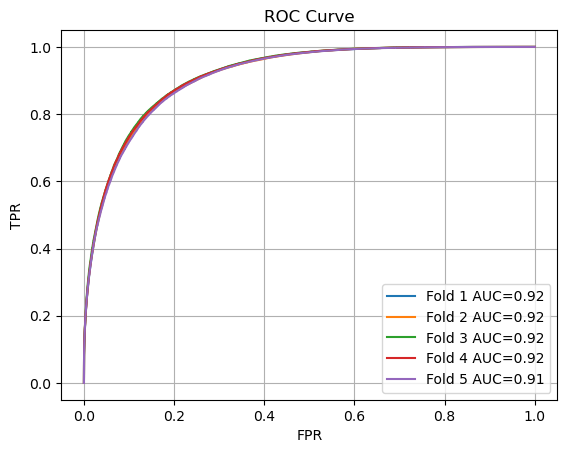


==== Average Metrics over 5 folds ====
Mean AUROC: 0.9160
Mean AUPRC: 0.9111
Mean F1: 0.8380
Mean Accuracy: 0.8338
Mean Precision: 0.8175
Mean Recall: 0.8595
Mean Confusion Matrix:
[[380476.2  90368.8]
 [ 66141.2 404703.8]]


In [52]:
# Map herbs and diseases to indices
herb_indices = dataset["Herb"].map(herb_idx).tolist()
disease_indices = dataset["Disease"].map(disease_idx).tolist()
labels = dataset["Association"].astype(int).tolist()

auroc, auprc, f1, accuracy, precision, recall, confusion, model, E_H, E_D = train_and_evaluate_kfold(
    X_herb=W_C, 
    G_herb=A_ch, 
    X_disease=W_T, 
    G_disease=A_td, 
    herb_indices=herb_indices, 
    disease_indices=disease_indices, 
    labels=labels
)


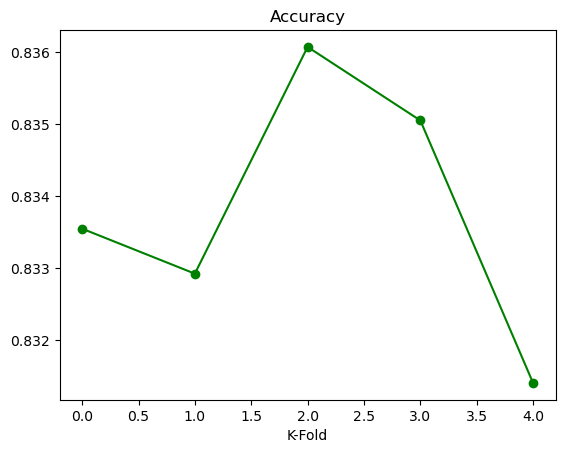

In [54]:
import matplotlib.pyplot as plt
plt.plot(accuracy,color="g",marker="o")
plt.title("Accuracy")
plt.xlabel("K-Fold")
plt.show()

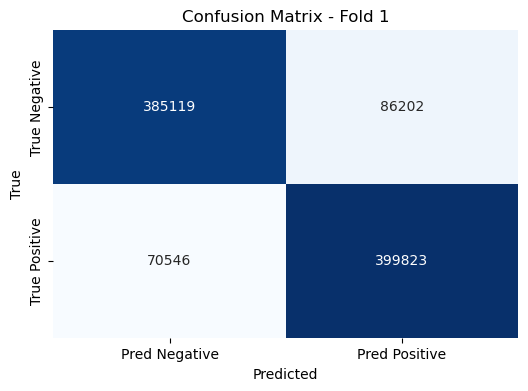

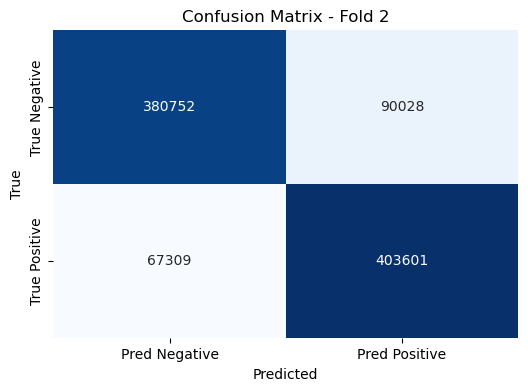

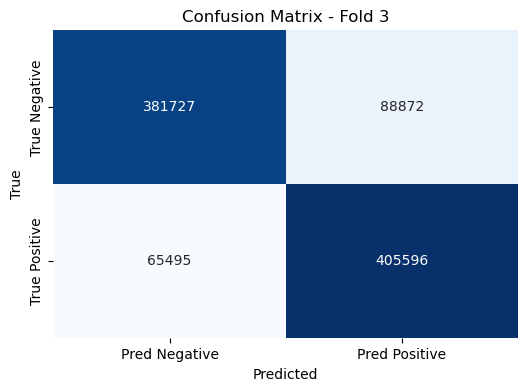

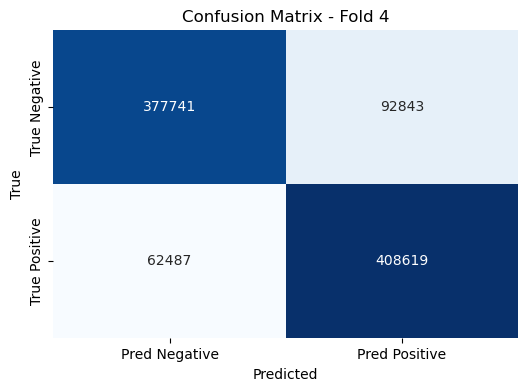

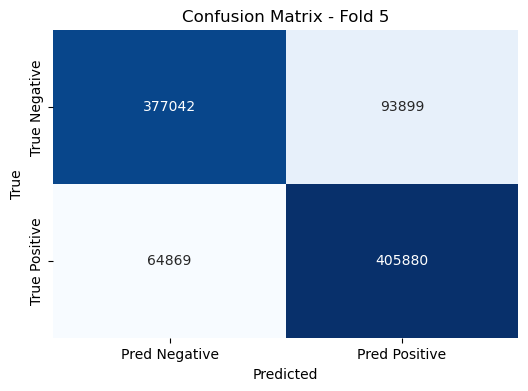

In [56]:
import seaborn as sns
fold=0
for conf in confusion:
    fold+=1
    conf_mat = np.array(conf)
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_mat, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["Pred Negative", "Pred Positive"], yticklabels=["True Negative", "True Positive"])
    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

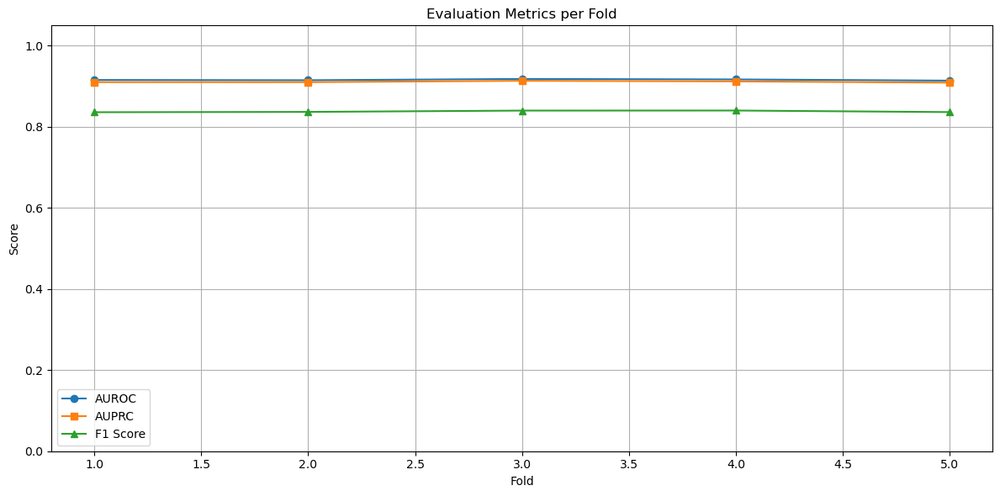

In [57]:
import matplotlib.pyplot as plt

folds = list(range(1, len(auroc) + 1))  # e.g., [1, 2, 3, 4, 5]

plt.figure(figsize=(12, 6))

# Plot AUROC
plt.plot(folds, auroc, marker='o', label='AUROC')

# Plot AUPRC
plt.plot(folds, auprc, marker='s', label='AUPRC')

# Plot F1 Score
plt.plot(folds, f1, marker='^', label='F1 Score')

plt.xlabel("Fold")
plt.ylabel("Score")
plt.title("Evaluation Metrics per Fold")
plt.ylim(0, 1.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


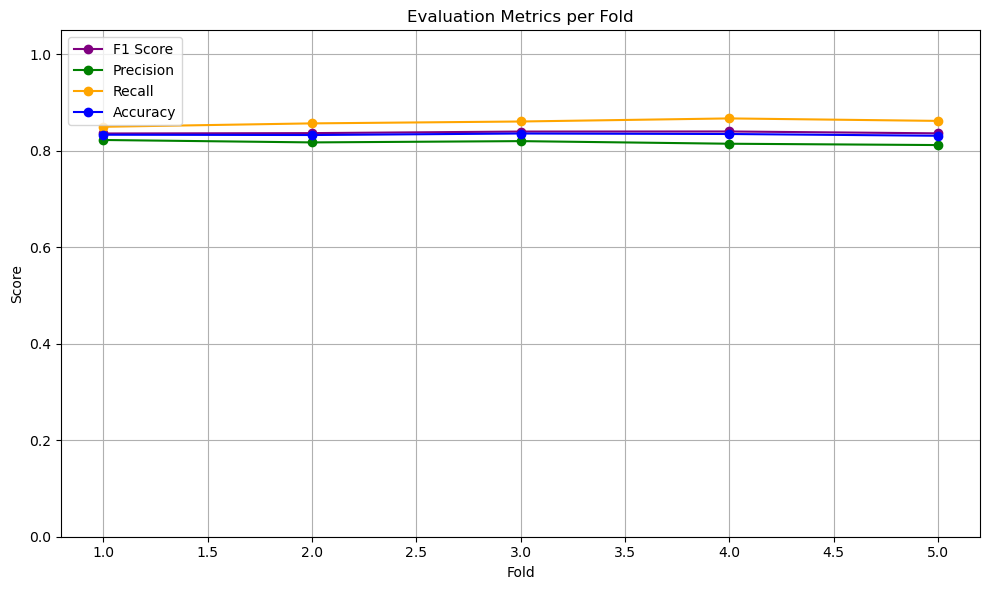

In [60]:
import matplotlib.pyplot as plt

metrics = [f1, precision, recall, accuracy]
names = ['F1 Score', 'Precision', 'Recall', 'Accuracy']
colors = ['purple', 'green', 'orange', 'blue']

plt.figure(figsize=(10, 6))
for i in range(4):
    plt.plot(range(1, len(metrics[i]) + 1), metrics[i], marker='o', label=names[i], color=colors[i])

plt.xlabel('Fold')
plt.ylabel('Score')
plt.title('Evaluation Metrics per Fold')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [65]:
def predict_association_by_dataset_index(herb_id, disease_id, model, E_H, E_D, herb_indices, disease_indices,
                                          X_disease, G_disease):
    # Extract the embeddings for herbs and diseases
    h_emb = E_H[herb_id]  # Embedding of the selected herb
    d_emb = E_D[disease_id]  # Embedding of the selected disease
    
    # Normalize the embeddings (just like in training)
    h_vec = torch.nn.functional.normalize(h_emb, p=2, dim=0)
    d_vec = torch.nn.functional.normalize(d_emb, p=2, dim=0)
    
    # Combine features
    interaction = torch.cat([h_vec, d_vec, h_vec * d_vec, torch.abs(h_vec - d_vec)], dim=0).unsqueeze(0)
    
    # Pass the interaction through the model's interaction layer (similar to training)
    score = torch.sigmoid(model.interaction_layer(interaction)).squeeze().item()
    
    # Predict class based on score threshold (e.g., 0.5 for binary classification)
    pred_class = 1 if score >= 0.5 else 0  # thresholding at 0.5

    return score, pred_class


In [66]:
def example_predict(herb_id, disease_id, model, E_H, E_D, herb_indices, disease_indices, X_disease, G_disease):
    prob, pred = predict_association_by_dataset_index(
        herb_id=herb_id, 
        disease_id=disease_id, 
        model=model, 
        E_H=E_H, 
        E_D=E_D, 
        herb_indices=herb_indices, 
        disease_indices=disease_indices, 
        X_disease=X_disease,  # Same input data you used for training
        G_disease=G_disease   # Same graph adjacency matrix as used in training
    )

    print(f"Prediction Probability: {prob:.4f}, Predicted Class: {pred}")
    return prob, pred


In [73]:
# Assuming you have your trained model `model` and the embeddings `E_H`, `E_D`
herb_id = 4037  # For example
disease_id = 312  # For example
mapped_herb_id = herb_global_to_local[herb_id]

# Map the global disease_id to a local index
mapped_disease_id = disease_global_to_local[disease_id]
prob, pred = example_predict(
    herb_id=mapped_herb_id,
    disease_id=mapped_disease_id,
    model=model,
    E_H=E_H,  # Trained herb embeddings
    E_D=E_D,  # Trained disease embeddings
    herb_indices=herb_indices,  # Same indices you used during training
    disease_indices=disease_indices,  # Same indices you used during training
    X_disease=W_T,  # Same input data used during training
    G_disease=A_td   # Same graph data used during training
)


Prediction Probability: 0.5875, Predicted Class: 1


### Indicates thqt the herb with id = 4037 is associated with the disease with id = 312
### The probability of association is > 0.5 therefore 1.


### Sampling the Dataset

In [27]:
import pandas as pd
import random

pos_df = pd.read_csv(r"H_D.txt", sep="\t", names=["Herb", "Disease", "Association"])
neg_df = pd.read_csv(r"negativehdlist.txt", sep="\t", names=["Herb", "Disease", "Association"])

# Balance positive and negative
neg_df = neg_df.sample(n=len(pos_df), random_state=42)

# Combine and shuffle
dataset = pd.concat([pos_df, neg_df])
dataset = dataset.sample(frac=1).reset_index(drop=True)


In [28]:
dataset.to_csv("Full_HD.csv",index=False)

In [29]:
dataset["Association"].value_counts()


Association
0    2354225
1    2354225
Name: count, dtype: int64

In [30]:
def score_function(E_H, E_D, herb_idx, disease_idx):
    h_vec = E_H[herb_idx]
    d_vec = E_D[disease_idx]
    h_vec = F.normalize(h_vec, p=2, dim=1)
    d_vec = F.normalize(d_vec, p=2, dim=1)
    score = torch.sigmoid(torch.sum(h_vec * d_vec, dim=1))
    return score

In [31]:
# Cross-Entropy Loss with L2 Regularization
def loss_fn(pred, label, model, lmbda=1e-4):
    ce = F.binary_cross_entropy(pred, label)
    reg = sum(torch.norm(p)**2 for p in model.parameters())
    return ce + lmbda * reg


In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [33]:
model = HGHDA(in_dim=64, hidden_dim=64).to(device)

# Move input tensors to the same device (assuming A_ch, A_td, W_C, W_T are already defined)
A_ch = A_ch.to(device)
A_td = A_td.to(device)
W_C = W_C.to(device)
W_T = W_T.to(device)

In [34]:
E_H, E_D = model(A_ch, A_td, W_C, W_T)

# Move the embeddings to the same device (if necessary)
E_H, E_D = E_H.to(device), E_D.to(device)



In [35]:
print("Herb embedding shape (E_H):", E_H.shape)
print("Disease embedding shape (E_D):", E_D.shape)

Herb embedding shape (E_H): torch.Size([1193, 64])
Disease embedding shape (E_D): torch.Size([11071, 64])


In [36]:
np.savetxt("herb_embedding_from_HGC.txt", E_H.detach().cpu().numpy())
np.savetxt("disease_embedding_from_HGC.txt", E_D.detach().cpu().numpy())

print("✅ Embeddings saved successfully.")

✅ Embeddings saved successfully.


In [37]:
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score
import torch.optim as optim

In [38]:
dataset.head()

,Herb,Disease,Association
0,1250,14597,0
1,4073,312,1
2,6909,7830,0
3,226,14263,1
4,7219,4079,0


In [39]:
herb_indices = dataset['Herb'].values
valid_herb_indices = sorted(set(dataset['Herb'].values))
herb_global_to_local = {global_idx: local_idx for local_idx, global_idx in enumerate(valid_herb_indices)}
mapped_herb_indices = [herb_global_to_local[idx] for idx in herb_indices]


disease_indices = dataset['Disease'].values
valid_disease_indices = sorted(set(dataset['Disease'].values))
# 2. Map from global index to local index
disease_global_to_local = {global_idx: local_idx for local_idx, global_idx in enumerate(valid_disease_indices)}
# 3. Remap dataset disease indices to local ones
mapped_disease_indices = [disease_global_to_local[idx] for idx in dataset['Disease'].values]


labels = dataset['Association'].values

In [40]:
# Convert to torch tensors
herb_indices = torch.tensor(mapped_herb_indices, dtype=torch.long)
disease_indices = torch.tensor(mapped_disease_indices, dtype=torch.long)
labels = torch.tensor(labels, dtype=torch.float32)

In [41]:
# Set up 5-fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
accuracy_list = []
auroc_list = []
auprc_list = []
f1_list = []

In [42]:
print(f"Max herb index: {herb_indices.max().item()}")
print(f"Max disease index: {disease_indices.max().item()}")


Max herb index: 1007
Max disease index: 11070


In [43]:
print("W_C stats:", W_C.mean(), W_C.std())


W_C stats: tensor(0.0153, device='cuda:0') tensor(0.4732, device='cuda:0')


In [44]:
def l2_normalize(weights):
    return F.normalize(weights, p=2, dim=1)  # Normalizing along the rows (each vector in the row)

# Normalize the weight matrices
W_C = torch.tensor(W_C)
W_T = torch.tensor(W_T)
W_C = l2_normalize(W_C)
W_T = l2_normalize(W_T)

print("Normalized W_ch:", W_C)
print("Normalized W_td:", W_T)

Normalized W_ch: tensor([[ 0.0142, -0.0040, -0.0199,  ..., -0.0022,  0.0245,  0.0438],
        [ 0.0165, -0.0018, -0.0224,  ..., -0.0085,  0.0192,  0.0443],
        [ 0.0196, -0.0078, -0.0172,  ..., -0.0567,  0.1432,  0.0215],
        ...,
        [ 0.0097, -0.0028, -0.0168,  ...,  0.0016,  0.0260,  0.0481],
        [ 0.0071, -0.0006, -0.0122,  ...,  0.0130,  0.0090,  0.0389],
        [ 0.0153, -0.0155, -0.0170,  ...,  0.0270,  0.0200,  0.0456]],
       device='cuda:0')
Normalized W_td: tensor([[ 0.0144,  0.1925,  0.0410,  ..., -0.0295, -0.0038,  0.0076],
        [ 0.0144,  0.1925,  0.0411,  ..., -0.0295, -0.0038,  0.0076],
        [ 0.0139,  0.1850,  0.0464,  ..., -0.0290, -0.0035,  0.0056],
        ...,
        [ 0.0143,  0.1900,  0.0428,  ..., -0.0293, -0.0037,  0.0070],
        [ 0.0136,  0.1815,  0.0487,  ..., -0.0288, -0.0034,  0.0047],
        [ 0.0104,  0.1372,  0.0768,  ..., -0.0258, -0.0018, -0.0061]],
       device='cuda:0')


/tmp/ipykernel_4052762/4003987976.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  W_C = torch.tensor(W_C)
/tmp/ipykernel_4052762/4003987976.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  W_T = torch.tensor(W_T)


In [45]:
print("W_T stats:", W_T.mean(), W_T.std())


W_T stats: tensor(0.0157, device='cuda:0') tensor(0.1240, device='cuda:0')


In [50]:
pred_np.mean(), pred_np.std()

(0.4968995, 0.051234998)

In [46]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [47]:
len(dataset)

4708450

In [48]:
herb_indices = dataset['Herb'].values
valid_herb_indices = sorted(set(dataset['Herb'].values))
herb_global_to_local = {global_idx: local_idx for local_idx, global_idx in enumerate(valid_herb_indices)}
mapped_herb_indices = [herb_global_to_local[idx] for idx in herb_indices]


disease_indices = dataset['Disease'].values
valid_disease_indices = sorted(set(dataset['Disease'].values))
# 2. Map from global index to local index
disease_global_to_local = {global_idx: local_idx for local_idx, global_idx in enumerate(valid_disease_indices)}
# 3. Remap dataset disease indices to local ones
mapped_disease_indices = [disease_global_to_local[idx] for idx in dataset['Disease'].values]


labels = dataset['Association'].values

# Convert to torch tensors
herb_indices = torch.tensor(mapped_herb_indices, dtype=torch.long)
disease_indices = torch.tensor(mapped_disease_indices, dtype=torch.long)
labels = torch.tensor(labels, dtype=torch.float32)

In [74]:
print("W_T shape:", W_T.shape)         # should be (7258, 64)
print("A_td shape:", A_td.shape)       # should be (7258, 11071)


W_T shape: torch.Size([7258, 64])
A_td shape: torch.Size([7258, 11071])
